In [1]:
import tensorflow as tf
import numpy as np
import glob
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from model import MY_MODEL
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping, LearningRateScheduler
from tensorflow.keras.metrics import Precision, Recall
from tensorflow import keras
%matplotlib inline

2024-04-30 18:04:46.054512: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-30 18:04:46.812616: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
img_train = glob.glob('./images/train/*/*.png')
label_train = [path.replace('images', 'gtFine').replace('_leftImg8bit.png', '_gtFine_labelTrainIds.png') for path in img_train]

img_val = glob.glob('./images/val/*/*.png')
label_val = [path.replace('images', 'gtFine').replace('_leftImg8bit.png', '_gtFine_labelTrainIds.png') for path in img_val]

img_combined = img_train + img_val
label_combined = label_train + label_val

index = np.random.permutation(len(img_combined))
img_combined = np.array(img_combined)[index]
label_combined = np.array(label_combined)[index]

split_index = int(len(img_combined) * 0.8)
img_train_new = img_combined[:split_index]
label_train_new = label_combined[:split_index]
img_val_new = img_combined[split_index:]
label_val_new = label_combined[split_index:]

dataset_train = tf.data.Dataset.from_tensor_slices((img_train_new, label_train_new))
dataset_val = tf.data.Dataset.from_tensor_slices((img_val_new, label_val_new))

print(len(label_train_new), len(label_val_new))

2024-04-30 18:04:48.043506: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355


2780 695


2024-04-30 18:04:48.053277: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-30 18:04:48.053528: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-30 18:04:48.055216: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

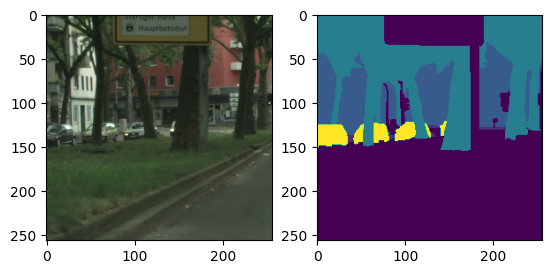

In [3]:
def read_png(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_png(img, channels=3)
    return img

def read_png_label(path):
    with tf.device('/cpu:0'): 
        img = tf.io.read_file(path)
        img = tf.image.decode_png(img, channels=1)
        img = tf.where(img == 255, tf.zeros_like(img), img)
    return img

def crop_img(img, mask):

    img_uint8 = tf.cast(img, tf.uint8)

    concat_img = tf.concat([img_uint8, mask], axis=-1)
    concat_img = tf.image.resize(concat_img, (512, 1024), method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    crop_img = tf.image.random_crop(concat_img, [256, 256, tf.shape(concat_img)[-1]])

    return crop_img[:, :, :3], tf.cast(crop_img[:, :, 3:], mask.dtype)



img_1 = read_png(img_train_new[0])
label_1 = read_png_label(label_train_new[0])
concat_img = tf.concat([img_1, label_1], axis=-1)
img_1, label_1 = crop_img(img_1, label_1)

plt.subplot(1,2,1)
plt.imshow(img_1.numpy())
plt.subplot(1,2,2)
plt.imshow(np.squeeze(label_1.numpy()))

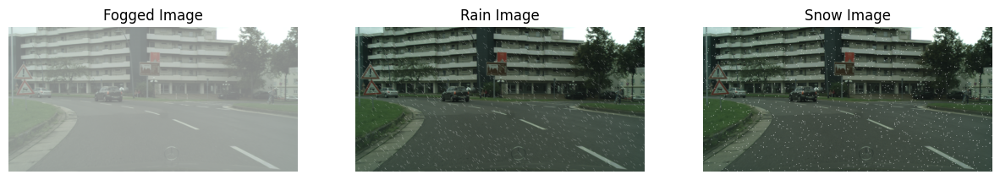

In [4]:
def add_fog_effect(image, fog_intensity=0.5):
    h, w = image.shape[:2]
    white_layer = np.ones((h, w, 3), dtype=np.uint8) * 255
    fogged_image = cv2.addWeighted(image, 1 - fog_intensity, white_layer, fog_intensity, 0)
    return fogged_image

def simulate_rain_effect(image, rain_density=1500, rain_width=1, rain_length=15):
    h, w = image.shape[:2]
    rain_image = image.copy()
    
    for _ in range(rain_density):
        x1 = np.random.randint(0, w)
        y1 = np.random.randint(0, h)
        x2 = x1 + np.random.randint(rain_length//2, rain_length)
        y2 = y1 + np.random.randint(rain_length//2, rain_length)
        cv2.line(rain_image, (x1, y1), (x2, y2), (255, 255, 255), rain_width)
    
    return rain_image

def simulate_snow_effect(image, snow_density=1500, snow_size=2):
    h, w = image.shape[:2]
    snow_image = image.copy()
    
    for _ in range(snow_density):
        x = np.random.randint(0, w)
        y = np.random.randint(0, h)
        cv2.circle(snow_image, (x, y), snow_size, (255, 255, 255), -1)
    
    return snow_image

image_path = 'images/train/aachen/aachen_000000_000019_leftImg8bit.png'
image = cv2.imread(image_path)

fogged_image = add_fog_effect(image, 0.5)
rain_image = simulate_rain_effect(image, 1500, 1, 15)
snow_image = simulate_snow_effect(image, 1500, 2)

import matplotlib.pyplot as plt

fogged_image_rgb = cv2.cvtColor(fogged_image, cv2.COLOR_BGR2RGB)
rain_image_rgb = cv2.cvtColor(rain_image, cv2.COLOR_BGR2RGB)
snow_image_rgb = cv2.cvtColor(snow_image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(fogged_image_rgb)
plt.title('Fogged Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(rain_image_rgb)
plt.title('Rain Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(snow_image_rgb)
plt.title('Snow Image')
plt.axis('off') 

plt.show()

In [5]:
def tf_add_fog_effect(image, intensity):
    def add_fog_effect(image, intensity):
        h, w = image.shape[:2]
        white_layer = np.ones((h, w, 3), dtype=np.uint8) * 255
        fogged_image = cv2.addWeighted(image, 1 - intensity, white_layer, intensity, 0)
        return fogged_image

    [fogged_image] = tf.numpy_function(add_fog_effect, [image, intensity], [tf.uint8])
    fogged_image.set_shape(image.shape)
    return fogged_image

def tf_simulate_rain_effect(image, density, width, length):
    def simulate_rain_effect(image, density, width, length):
        h, w = image.shape[:2]
        rain_image = image.copy()

        for _ in range(density):
            x1 = np.random.randint(0, w)
            y1 = np.random.randint(0, h)
            x2 = x1 + np.random.randint(length//2, length)
            y2 = y1 + np.random.randint(length//2, length)
            cv2.line(rain_image, (x1, y1), (x2, y2), (255, 255, 255), width)

        return rain_image

    [rain_image] = tf.numpy_function(simulate_rain_effect, [image, density, width, length], [tf.uint8])
    rain_image.set_shape(image.shape)
    return rain_image

def tf_simulate_snow_effect(image, density, size):
    def simulate_snow_effect(image, density, size):
        h, w = image.shape[:2]
        snow_image = image.copy()

        for _ in range(density):
            x = np.random.randint(0, w)
            y = np.random.randint(0, h)
            cv2.circle(snow_image, (x, y), size, (255, 255, 255), -1)

        return snow_image

    [snow_image] = tf.numpy_function(simulate_snow_effect, [image, density, size], [tf.uint8])
    snow_image.set_shape(image.shape)
    return snow_image

In [6]:
def normal(img, mask):
    img = tf.cast(img, tf.float32)/127.5 -1
    mask = tf.cast(mask, tf.int32)
    return img, mask


# def apply_sobel_filter(image, enhancement_factor=1.0):
#     image_np = image.numpy()
#     gray = cv2.cvtColor(image_np, cv2.COLOR_RGB2GRAY)
#     sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
#     sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
#     sobel = np.sqrt(sobelx**2 + sobely**2)
    
#     sobel_normalized = cv2.normalize(sobel, None, 0, 255, cv2.NORM_MINMAX)
    
#     sobel_adjusted = sobel_normalized * enhancement_factor
    
#     sobel_tensor = tf.convert_to_tensor(sobel_adjusted, dtype=tf.float32)
    
#     sobel_tensor_resized = tf.image.resize(sobel_tensor[..., tf.newaxis], [image.shape[0], image.shape[1]])
    
#     return sobel_tensor_resized / 255.0

def load_image_train(img_path, mask_path):
    img = read_png(img_path)
    mask = read_png_label(mask_path)
    
    img = tf.image.random_saturation(img, lower=0.5, upper=1.5)
    img = tf.image.random_hue(img, max_delta=0.2)
    img = tf.image.random_contrast(img, lower=0.5, upper=1.5)
    img = tf.clip_by_value(img, 0, 255)
    
    scale = tf.random.uniform([], 0.7, 2)
    new_height = tf.cast(tf.cast(tf.shape(img)[0], tf.float32) * scale, tf.int32)
    new_width = tf.cast(tf.cast(tf.shape(img)[1], tf.float32) * scale, tf.int32)
    img = tf.image.resize(img, [new_height, new_width])
    mask = tf.image.resize(mask, [new_height, new_width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    img, mask = crop_img(img, mask)
    
    if tf.random.uniform(()) > 0.5:
        img = tf.image.flip_left_right(img)
        mask = tf.image.flip_left_right(mask)
        
    
    if tf.random.uniform(()) > 0.98:
        img = tf_add_fog_effect(img, 0.2)
    if tf.random.uniform(()) > 0.98:
        img = tf_simulate_rain_effect(img, 100, 1, 15)
    if tf.random.uniform(()) > 0.98:
        img = tf_simulate_snow_effect(img, 100, 2)
    
    # img = tf.py_function(func=apply_sobel_filter, inp=[img], Tout=tf.float32)

    img, mask = normal(img, mask)

    return img, mask


def load_image_val(img_path, mask_path):
    img = read_png(img_path)
    mask = read_png_label(mask_path)
    
    img, mask = crop_img(img, mask)
        
    img, mask = normal(img, mask)
    
    return img, mask

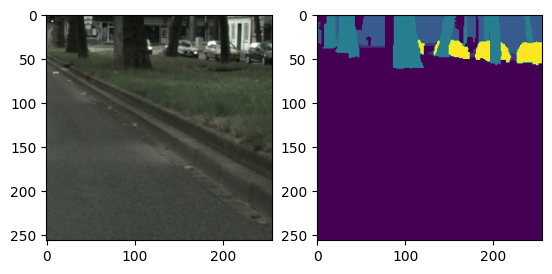

In [7]:
BCTCH_SIZE = 24
# BUFFER_SIZE = 128
# step_per_epoch = train_count//BCTCH_SIZE
# val_step = val_count//BCTCH_SIZE

auto = tf.data.experimental.AUTOTUNE
dataset_train = dataset_train.map(load_image_train, num_parallel_calls=auto)
dataset_val = dataset_val.map(load_image_val, num_parallel_calls=auto)

for i, m in dataset_train.take(1):
    plt.subplot(1,2,1)
    plt.imshow((i.numpy() + 1)/2)
    plt.subplot(1,2,2)
    plt.imshow(np.squeeze(m.numpy()))

dataset_train = dataset_train.batch(BCTCH_SIZE)
dataset_val = dataset_val.batch(BCTCH_SIZE)

In [8]:
dataset_train

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 1), dtype=tf.int32, name=None))>

In [9]:
class Downsample(keras.layers.Layer):
    def __init__(self, units):
        super(Downsample, self).__init__()
        self.conv1 = keras.layers.Conv2D(units, kernel_size=3, padding='same')
        self.conv2 = keras.layers.Conv2D(units, kernel_size=3, padding='same')
        self.pool = keras.layers.MaxPooling2D()
    def call(self, x, is_pool=True):
        if is_pool:
            x = self.pool(x)
        x = self.conv1(x)
        x = tf.nn.relu(x)
        x = self.conv2(x)
        x = tf.nn.relu(x)
        return x
    
class Upsample(keras.layers.Layer):
    def __init__(self, unit):
        super(Upsample, self).__init__()
        self.conv1 = keras.layers.Conv2D(unit, kernel_size=3, padding='same')
        self.conv2 = keras.layers.Conv2D(unit, kernel_size=3, padding='same')
        self.deconv = keras.layers.Conv2DTranspose(unit//2,
                                                   kernel_size=3,
                                                   strides=2,
                                                   padding='same')
        
    def call(self, x, is_pool=True):
        x = self.conv1(x)
        x = tf.nn.relu(x)
        x = self.conv2(x)
        x = tf.nn.relu(x)
        x = self.deconv(x)
        x = tf.nn.relu(x)
        return x
    
class Net(keras.Model):
    def __init__(self):
        super(Net, self).__init__()
        self.down1 = Downsample(64)
        self.down2 = Downsample(128)
        self.down3 = Downsample(256)
        self.down4 = Downsample(512)
        self.down5 = Downsample(1024)
        
        self.up1 = Upsample(512)
        self.up2 = Upsample(256)
        self.up3 = Upsample(128)
        
        self.conv_last = Downsample(64)
        
        self.up = keras.layers.Conv2DTranspose(512,
                                               kernel_size=3,
                                               strides = 2,
                                               padding='same')
        
        self.last = keras.layers.Conv2D(11,
                                        kernel_size=1,
                                        padding='same')

    def call(self, x):
        x1 = self.down1(x, is_pool=False)         # 256*256*64
        x2 = self.down2(x1)                       # 128*128*128
        x3 = self.down3(x2)                       # 64*64*256
        x4 = self.down4(x3)                       # 32*32*512
        x5 = self.down5(x4)                       # 16*16*1024
        
        x5 = self.up(x5)                          # 32*32*512
        
        x5 = tf.concat([x4,x5], axis=-1)          # 32*32*1024
        x5 = self.up1(x5)                         # 64*64*256
        x5 = tf.concat([x3,x5], axis=-1)          # 64*64*512   
        x5 = self.up2(x5)                         # 128*128*128
        x5 = tf.concat([x2,x5], axis=-1)          # 128*128*256
        x5 = self.up3(x5)                         # 256*256*64
        x5 = tf.concat([x1,x5], axis=-1)          # 256*256*128
        
        x5 = self.conv_last(x5, is_pool=False)    # 256*256*64
        
        x5 = self.last(x5)                        # 256*256*3
        return x5

In [10]:
model = Net()

In [11]:
class MeanIoU(tf.keras.metrics.MeanIoU):
    def __call__(self, y_true, y_pred, sample_weight=None):
        y_pred = tf.argmax(y_pred, axis=-1)
        return super().__call__(y_true, y_pred, sample_weight=sample_weight)

# optimizer = tf.keras.optimizers.Adam(learning_rate=5e-4)

loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)


def dice_loss_multiclass(y_true, y_pred, num_classes=11, smooth=1e-6):
    y_true = tf.one_hot(tf.cast(y_true, tf.int32), depth=num_classes)
    y_true = tf.cast(y_true, tf.float32)
    
    y_pred = tf.nn.softmax(y_pred, axis=-1)

    dice_loss = 0
    for c in range(num_classes):
        true_c = y_true[..., c]
        pred_c = y_pred[..., c]
        
        true_c = tf.squeeze(true_c, axis=-1)
        
        intersection = tf.reduce_sum(true_c * pred_c, axis=[1, 2])
        union = tf.reduce_sum(true_c, axis=[1, 2]) + tf.reduce_sum(pred_c, axis=[1, 2])
        dice_c = (2. * intersection + smooth) / (union + smooth)
        dice_loss += (1 - dice_c)
    
    return dice_loss / num_classes

def combined_loss_multiclass(y_true, y_pred, num_classes=11):
    ce_loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)(y_true, y_pred)
    d_loss = dice_loss_multiclass(y_true, y_pred, num_classes)
    total_loss = (ce_loss + d_loss) / 2.0
    return total_loss

train_loss = tf.keras.metrics.Mean(name='train_loss')
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='train_accuracy')
train_iou = MeanIoU(11, name='train_iou')

test_loss = tf.keras.metrics.Mean(name='test_loss')
test_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='test_accuracy')
test_iou = MeanIoU(11, name='test_iou')

In [12]:
base_learning_rate = 0.01
momentum = 0.9
weight_decay = 0.0001
power = 1.2
total_steps = 18550

learning_rate_schedule = tf.keras.optimizers.schedules.PolynomialDecay(
    initial_learning_rate=base_learning_rate,
    decay_steps=total_steps,
    end_learning_rate=0.0, 
    power=power
)

class SGDW(tf.keras.optimizers.SGD):
    def __init__(self, weight_decay, *args, **kwargs):
        super(SGDW, self).__init__(*args, **kwargs)
        self.weight_decay = weight_decay

    def _resource_apply_dense(self, grad, var, apply_state=None):
        var_dtype = var.dtype.base_dtype
        lr_t = self._decayed_lr(var_dtype)
        wd = lr_t * self.weight_decay

        var.assign_sub((lr_t * grad) + (wd * var))

optimizer = SGDW(
    weight_decay=weight_decay,
    learning_rate=learning_rate_schedule,
    momentum=momentum
)

In [13]:
train_losses = []
train_accuracies = []
train_ious = []
test_losses = []
test_accuracies = []
test_ious = []
train_precisions = []
train_recalls = []
test_precisions = []
test_recalls = []


train_precision = Precision()
train_recall = Recall()
test_precision = Precision()
test_recall = Recall()

@tf.function
def train_step(images, labels):
    with tf.GradientTape() as tape:
        predictions = model(images, training=True)
        loss = combined_loss_multiclass(labels, predictions, 11)
    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))

    train_loss(loss)
    train_accuracy(labels, predictions)
    train_iou(labels, predictions)
    train_precision.update_state(labels, tf.argmax(predictions, axis=-1))
    train_recall.update_state(labels, tf.argmax(predictions, axis=-1))

@tf.function
def test_step(images, labels):
    predictions = model(images, training=False)
    t_loss = combined_loss_multiclass(labels, predictions, 11)

    test_loss(t_loss)
    test_accuracy(labels, predictions)
    test_iou(labels, predictions)
    test_precision.update_state(labels, tf.argmax(predictions, axis=-1))
    test_recall.update_state(labels, tf.argmax(predictions, axis=-1))

EPOCHS = 100

for epoch in range(EPOCHS):
    train_loss.reset_states()
    train_accuracy.reset_states()
    train_iou.reset_states()
    train_precision.reset_states()
    train_recall.reset_states()
    test_loss.reset_states()
    test_accuracy.reset_states()
    test_iou.reset_states()
    test_precision.reset_states()
    test_recall.reset_states()

    for images, labels in dataset_train:
        train_step(images, labels)

    for test_images, test_labels in dataset_val:
        test_step(test_images, test_labels)


    print('Epoch {:3d}, Loss: {:.3f}, Accuracy: {:.3f}, IOU: {:.3f}, Precision: {:.3f}, Recall: {:.3f}, Test Loss: {:.3f}, Test Accuracy: {:.3f}, Test IOU: {:.3f}, Test Precision: {:.3f}, Test Recall: {:.3f}'.format(
        epoch+1, train_loss.result(), train_accuracy.result()*100, train_iou.result(), 
        train_precision.result(), train_recall.result(), 
        test_loss.result(), test_accuracy.result()*100, test_iou.result(), 
        test_precision.result(), test_recall.result()
    ))

    train_losses.append(train_loss.result())
    train_accuracies.append(train_accuracy.result().numpy() * 100)
    train_ious.append(train_iou.result())
    train_precisions.append(train_precision.result().numpy())
    train_recalls.append(train_recall.result().numpy())
    test_losses.append(test_loss.result())
    test_accuracies.append(test_accuracy.result().numpy() * 100)
    test_ious.append(test_iou.result())
    test_precisions.append(test_precision.result().numpy())
    test_recalls.append(test_recall.result().numpy())

2024-04-30 18:04:58.033024: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8600
2024-04-30 18:05:10.491636: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7ff19d43f5a0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-04-30 18:05:10.491726: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): Tesla V100-FHHL-16GB, Compute Capability 7.0
2024-04-30 18:05:10.574155: I ./tensorflow/compiler/jit/device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Epoch   1, Loss: 1.249, Accuracy: 48.762, IOU: 0.068, Precision: 0.753, Recall: 0.058, Test Loss: 1.195, Test Accuracy: 51.211, Test IOU: 0.082, Test Precision: 0.915, Test Recall: 0.062
Epoch   2, Loss: 1.195, Accuracy: 49.516, IOU: 0.078, Precision: 0.736, Recall: 0.125, Test Loss: 1.139, Test Accuracy: 49.996, Test IOU: 0.081, Test Precision: 0.867, Test Recall: 0.068
Epoch   3, Loss: 1.169, Accuracy: 49.890, IOU: 0.087, Precision: 0.774, Recall: 0.215, Test Loss: 1.116, Test Accuracy: 54.276, Test IOU: 0.139, Test Precision: 0.748, Test Recall: 0.772
Epoch   4, Loss: 1.143, Accuracy: 50.245, IOU: 0.104, Precision: 0.765, Recall: 0.414, Test Loss: 1.104, Test Accuracy: 52.169, Test IOU: 0.113, Test Precision: 0.785, Test Recall: 0.322
Epoch   5, Loss: 1.105, Accuracy: 53.660, IOU: 0.117, Precision: 0.791, Recall: 0.541, Test Loss: 1.124, Test Accuracy: 51.144, Test IOU: 0.094, Test Precision: 0.833, Test Recall: 0.122
Epoch   6, Loss: 1.061, Accuracy: 56.336, IOU: 0.135, Precision: 

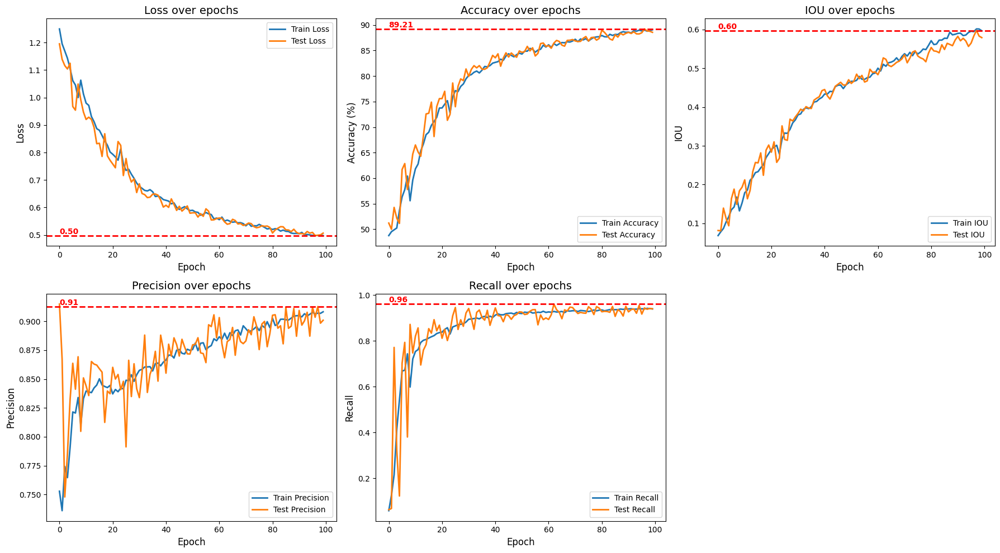

In [14]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

plt.figure(figsize=(18, 10))

def draw_plot(position, metric_name, train_data, test_data, ylabel, find_max=True, second_max=False):
    plt.subplot(2, 3, position)
    plt.plot(train_data, label=f'Train {metric_name}', linewidth=2)
    plt.plot(test_data, label=f'Test {metric_name}', linewidth=2)
    plt.title(f'{metric_name} over epochs', fontsize=14)
    plt.xlabel('Epoch', fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    
    if find_max:
        special_value = max(test_data)
        if second_max:
            temp_data = test_data.copy()
            temp_data.remove(special_value)
            special_value = max(temp_data)
        line_label = 'Max' if not second_max else '2nd Max'
    else:
        special_value = min(test_data)
        line_label = 'Min'
    
    plt.axhline(y=special_value, color='r', linestyle='--', linewidth=2)
    plt.text(0, special_value, f'{special_value:.2f}', color='red', verticalalignment='bottom', horizontalalignment='left', fontweight='bold')
    plt.legend(loc='best')

draw_plot(1, 'Loss', train_losses, test_losses, 'Loss', find_max=False)
draw_plot(2, 'Accuracy', train_accuracies, test_accuracies, 'Accuracy (%)', find_max=True)
draw_plot(3, 'IOU', train_ious, test_ious, 'IOU', find_max=True)
draw_plot(4, 'Precision', train_precisions, test_precisions, 'Precision', find_max=True, second_max=True)
draw_plot(5, 'Recall', train_recalls, test_recalls, 'Recall', find_max=True)

plt.tight_layout()
plt.show()

In [15]:
# model.save('my_model.h5') 

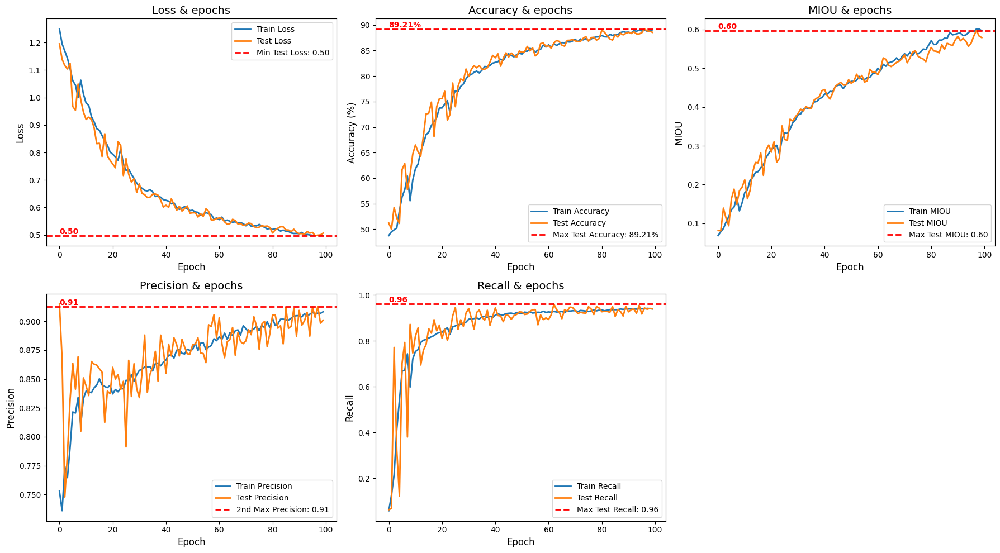

In [16]:
plt.figure(figsize=(18, 10))

# Enhanced Loss plot
plt.subplot(2, 3, 1)
plt.plot(train_losses, label='Train Loss', linewidth=2)
plt.plot(test_losses, label='Test Loss', linewidth=2)
plt.title('Loss & epochs', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
min_loss = min(test_losses)
plt.axhline(y=min_loss, color='r', linestyle='--', linewidth=2)
plt.text(0, min_loss, f'{min_loss:.2f}', color='red', verticalalignment='bottom', horizontalalignment='left', fontweight='bold')
handles, labels = plt.gca().get_legend_handles_labels()
handles.append(Line2D([0], [0], color='r', lw=2, linestyle='--', label=f'Min Test Loss: {min_loss:.2f}'))
plt.legend(handles=handles, loc='upper right')

# Enhanced Accuracy plot
plt.subplot(2, 3, 2)
plt.plot(train_accuracies, label='Train Accuracy', linewidth=2)
plt.plot(test_accuracies, label='Test Accuracy', linewidth=2)
plt.title('Accuracy & epochs', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy (%)', fontsize=12)
max_accuracy = max(test_accuracies)
plt.axhline(y=max_accuracy, color='r', linestyle='--', linewidth=2)
plt.text(0, max_accuracy, f'{max_accuracy:.2f}%', color='red', verticalalignment='bottom', horizontalalignment='left', fontweight='bold')
handles, labels = plt.gca().get_legend_handles_labels()
handles.append(Line2D([0], [0], color='r', lw=2, linestyle='--', label=f'Max Test Accuracy: {max_accuracy:.2f}%'))
plt.legend(handles=handles, loc='lower right')

# Enhanced IOU plot
plt.subplot(2, 3, 3)
plt.plot(train_ious, label='Train MIOU', linewidth=2)
plt.plot(test_ious, label='Test MIOU', linewidth=2)
plt.title('MIOU & epochs', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('MIOU', fontsize=12)
max_iou = max(test_ious)
plt.axhline(y=max_iou, color='r', linestyle='--', linewidth=2)
plt.text(0, max_iou, f'{max_iou:.2f}', color='red', verticalalignment='bottom', horizontalalignment='left', fontweight='bold')
handles, labels = plt.gca().get_legend_handles_labels()
handles.append(Line2D([0], [0], color='r', lw=2, linestyle='--', label=f'Max Test MIOU: {max_iou:.2f}'))
plt.legend(handles=handles, loc='lower right')

plt.subplot(2, 3, 4)
plt.plot(train_precisions, label='Train Precision', linewidth=2)
plt.plot(test_precisions, label='Test Precision', linewidth=2)
plt.title('Precision & epochs', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Precision', fontsize=12)
temp_precisions = test_precisions.copy()
temp_precisions.remove(max(temp_precisions))
second_max_precisions = max(temp_precisions)
plt.axhline(y=second_max_precisions, color='r', linestyle='--', linewidth=2)
plt.text(0, second_max_precisions, f'{second_max_precisions:.2f}', color='red', verticalalignment='bottom', horizontalalignment='left', fontweight='bold')
handles, labels = plt.gca().get_legend_handles_labels()
handles.append(Line2D([0], [0], color='r', lw=2, linestyle='--', label=f'2nd Max Precision: {second_max_precisions:.2f}'))
plt.legend(handles=handles, loc='lower right')


# Enhanced Recall plot
plt.subplot(2, 3, 5)
line1, = plt.plot(train_recalls, label='Train Recall', linewidth=2)
line2, = plt.plot(test_recalls, label='Test Recall', linewidth=2)
plt.title('Recall & epochs', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Recall', fontsize=12)
max_recall = max(test_recalls)
max_index = test_recalls.index(max_recall)
plt.axhline(y=max_recall, color='r', linestyle='--', linewidth=2)
legend_line = Line2D([0], [0], color='r', lw=2, linestyle='--', label=f'Max Test Recall: {max_recall:.2f}')
handles, labels = plt.gca().get_legend_handles_labels()
handles.append(legend_line)
plt.legend(handles=handles, loc='lower right')
plt.text(0, max_recall, f'{max_recall:.2f}', color='red', verticalalignment='bottom', horizontalalignment='left', fontweight='bold')

plt.tight_layout()
plt.show()

1/1 [==============================] - 0s 353ms/step


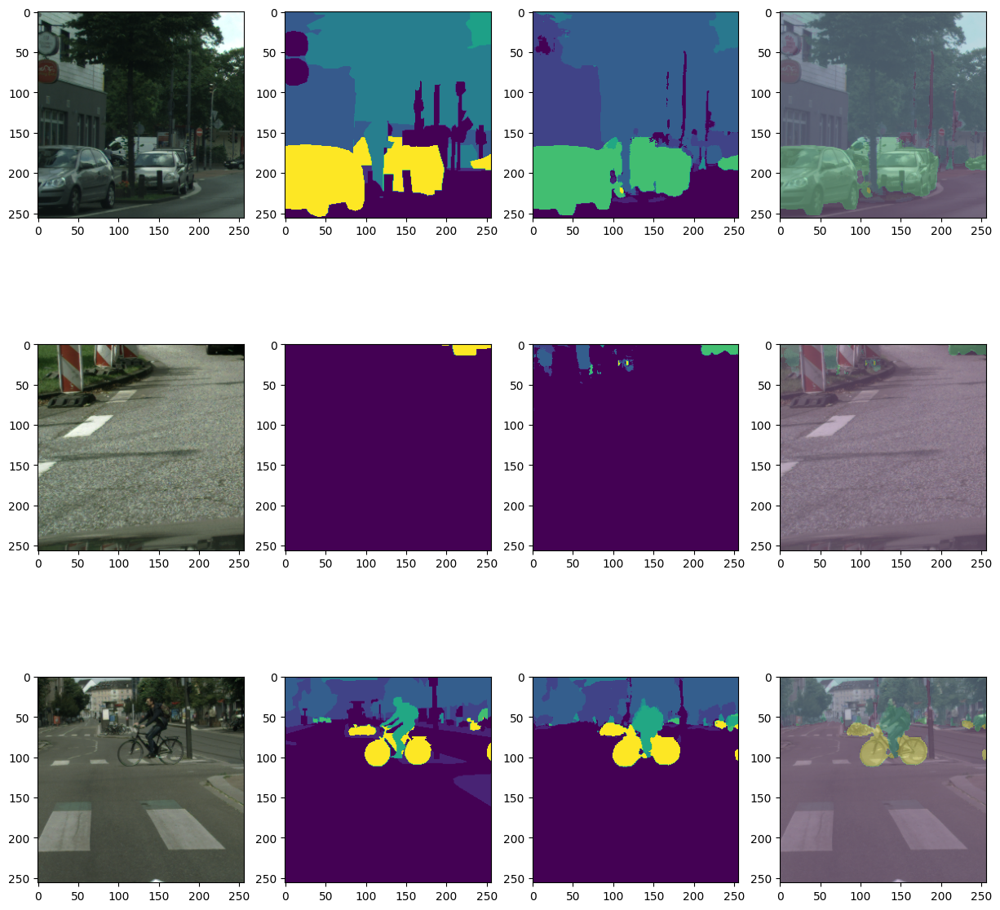

1/1 [==============================] - 0s 39ms/step


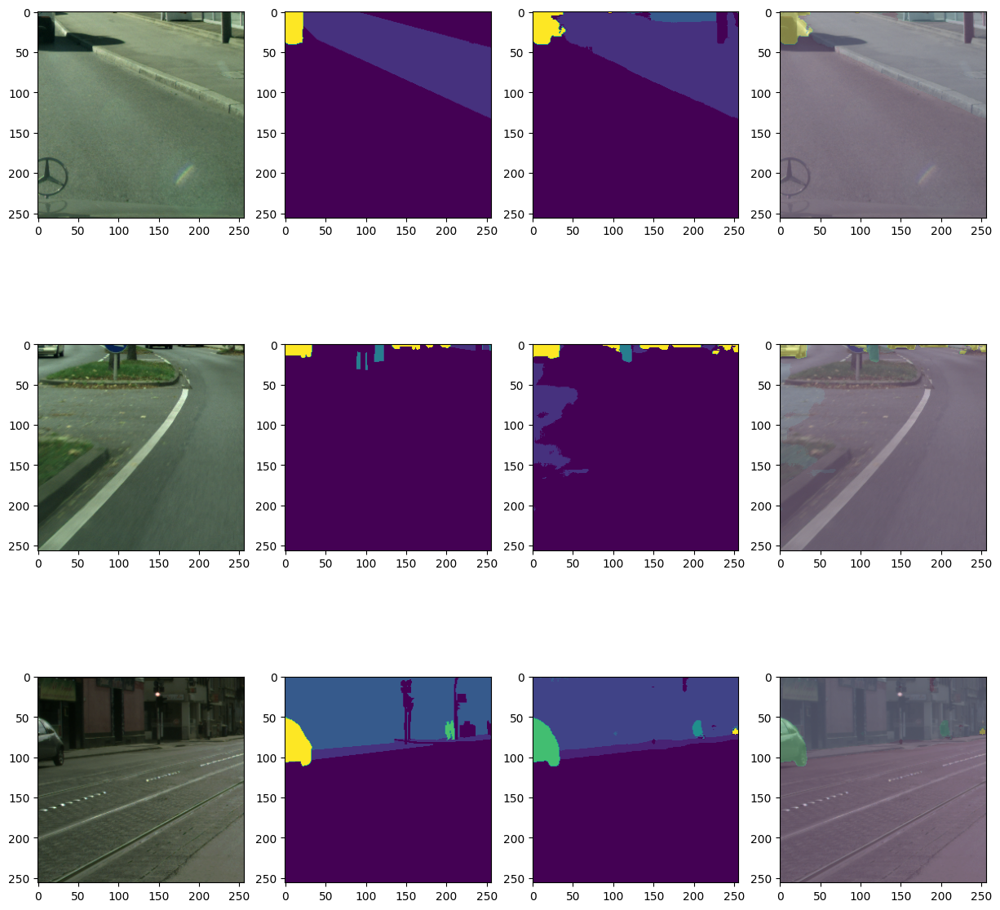

1/1 [==============================] - 0s 105ms/step


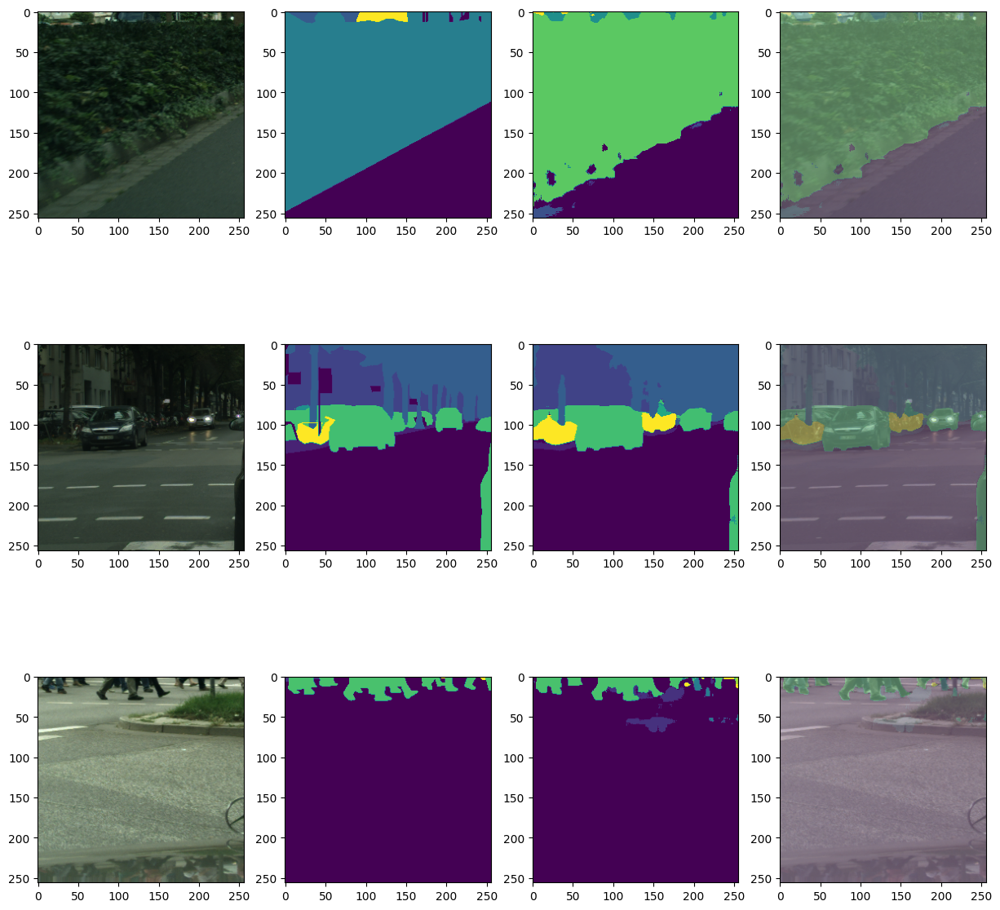

1/1 [==============================] - 0s 80ms/step


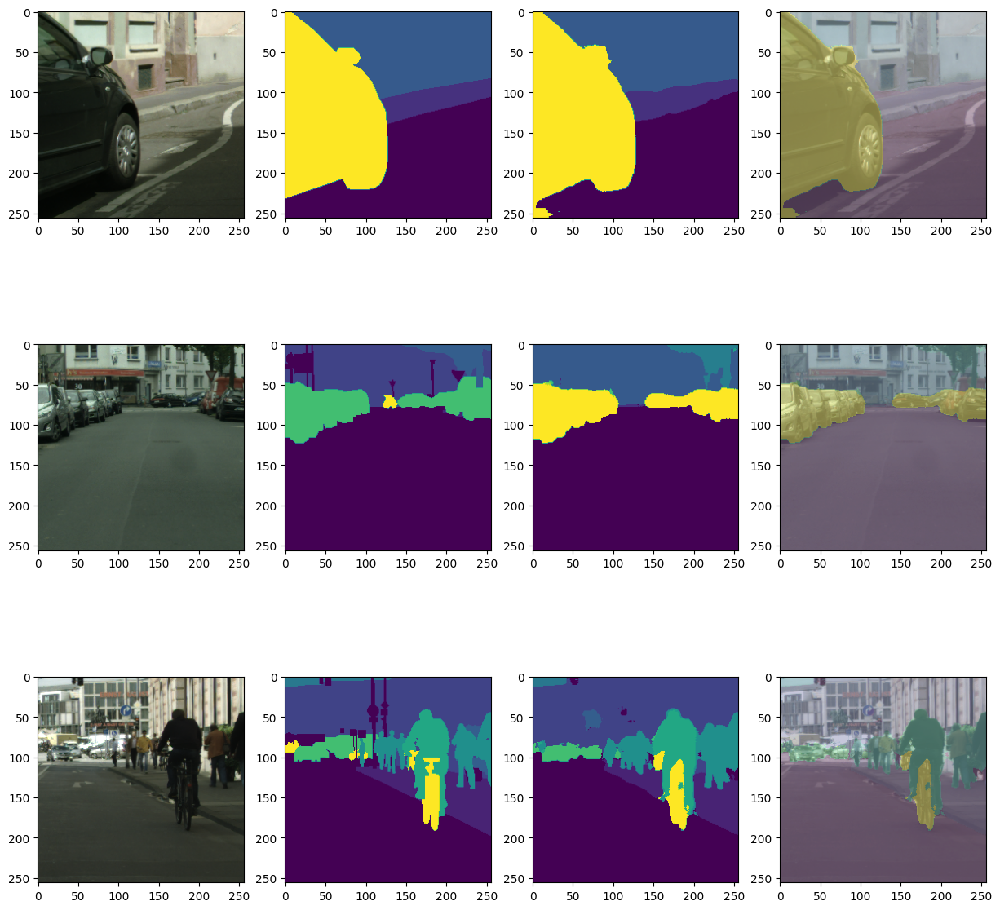

1/1 [==============================] - 0s 57ms/step


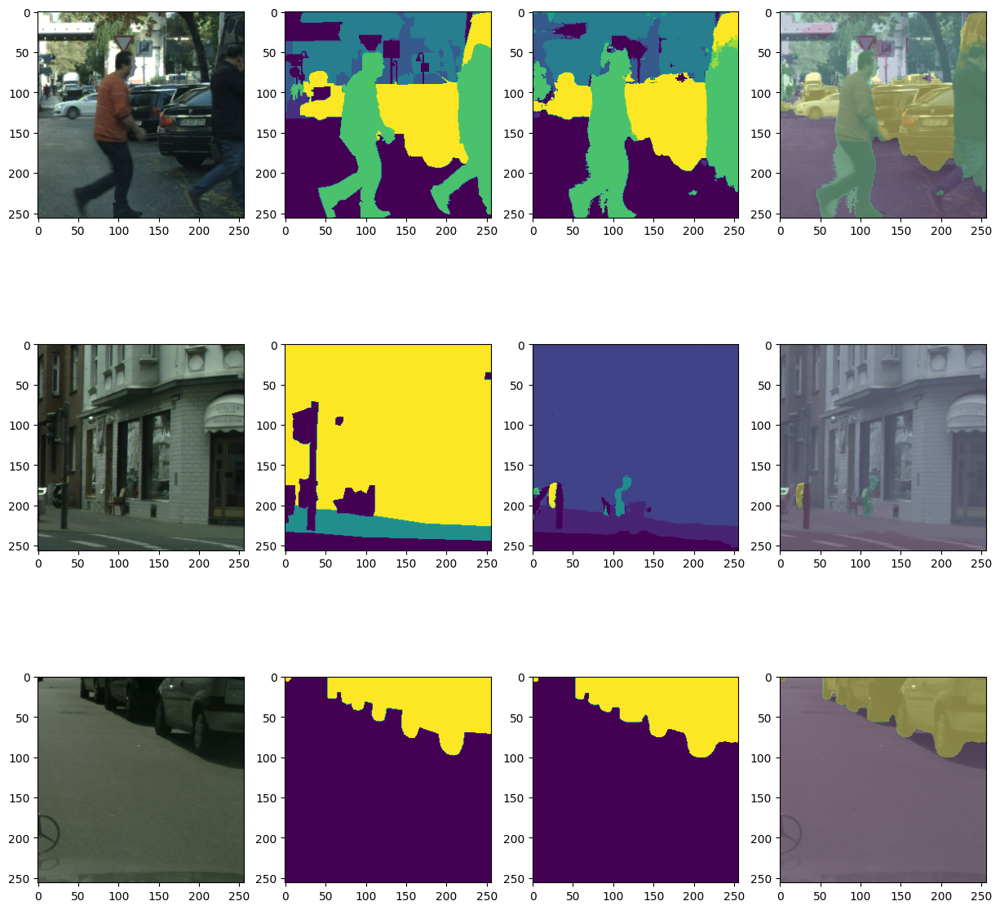

1/1 [==============================] - 0s 61ms/step


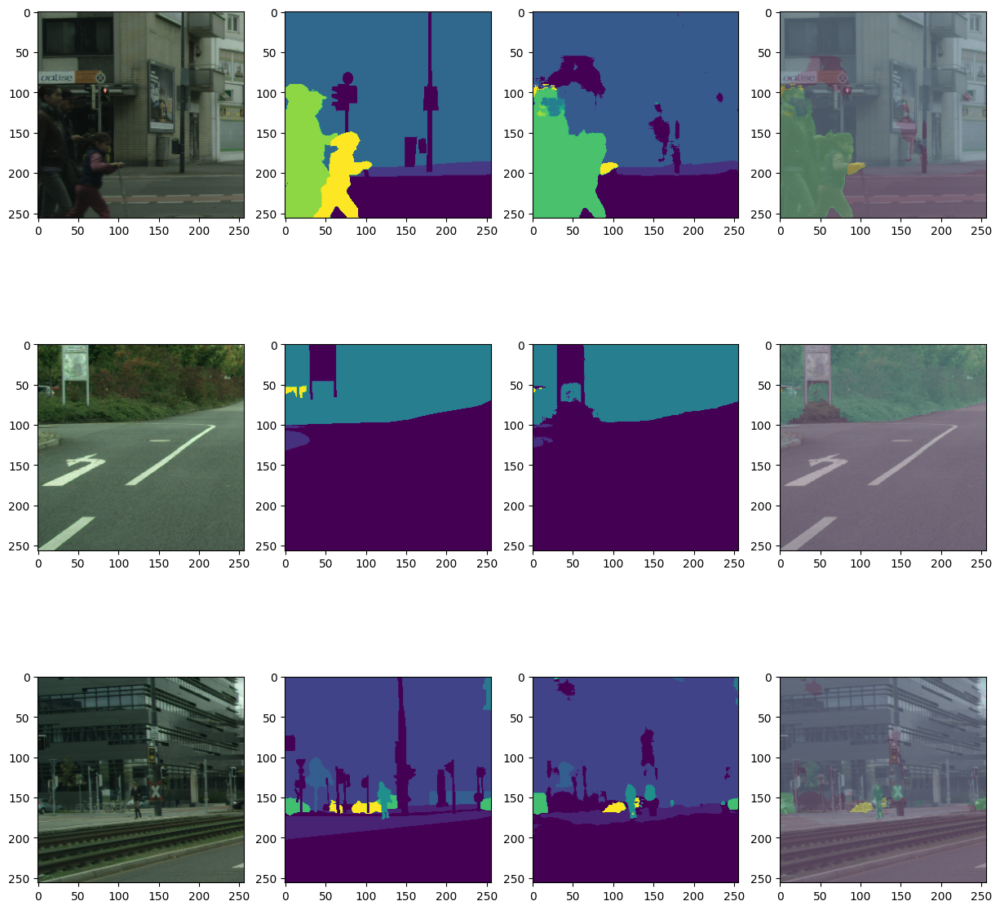

1/1 [==============================] - 0s 74ms/step


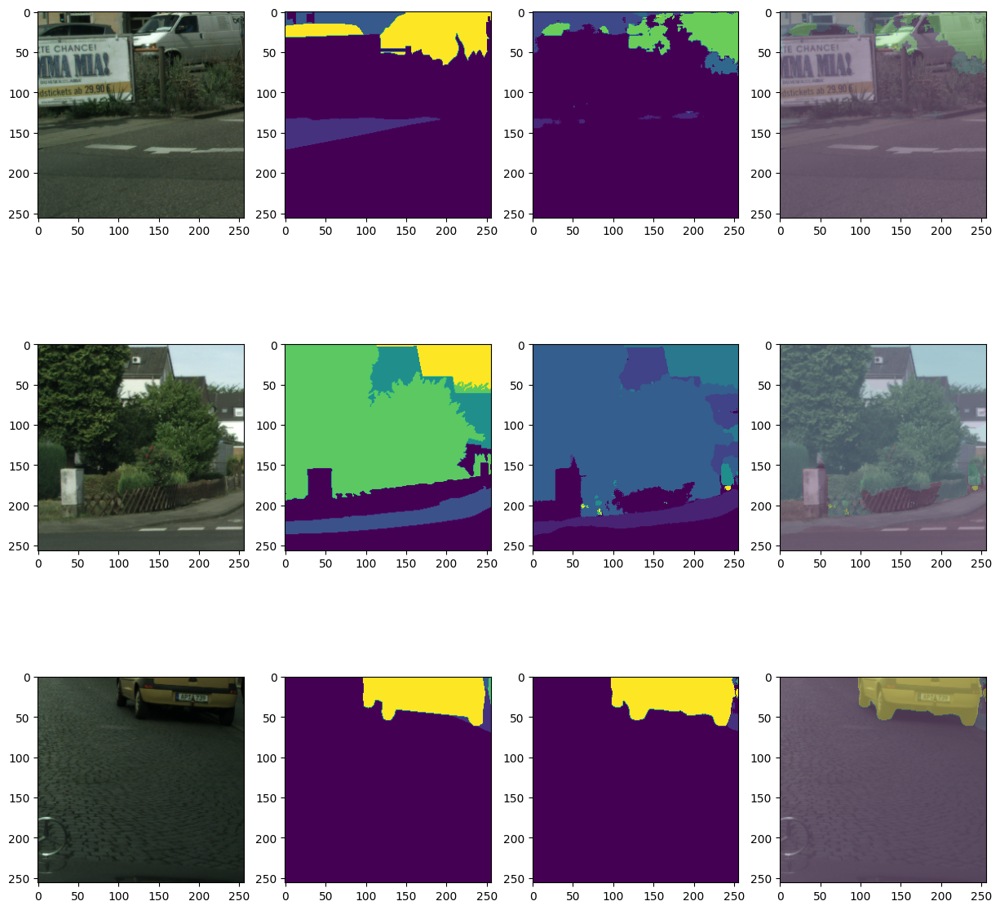

1/1 [==============================] - 0s 96ms/step


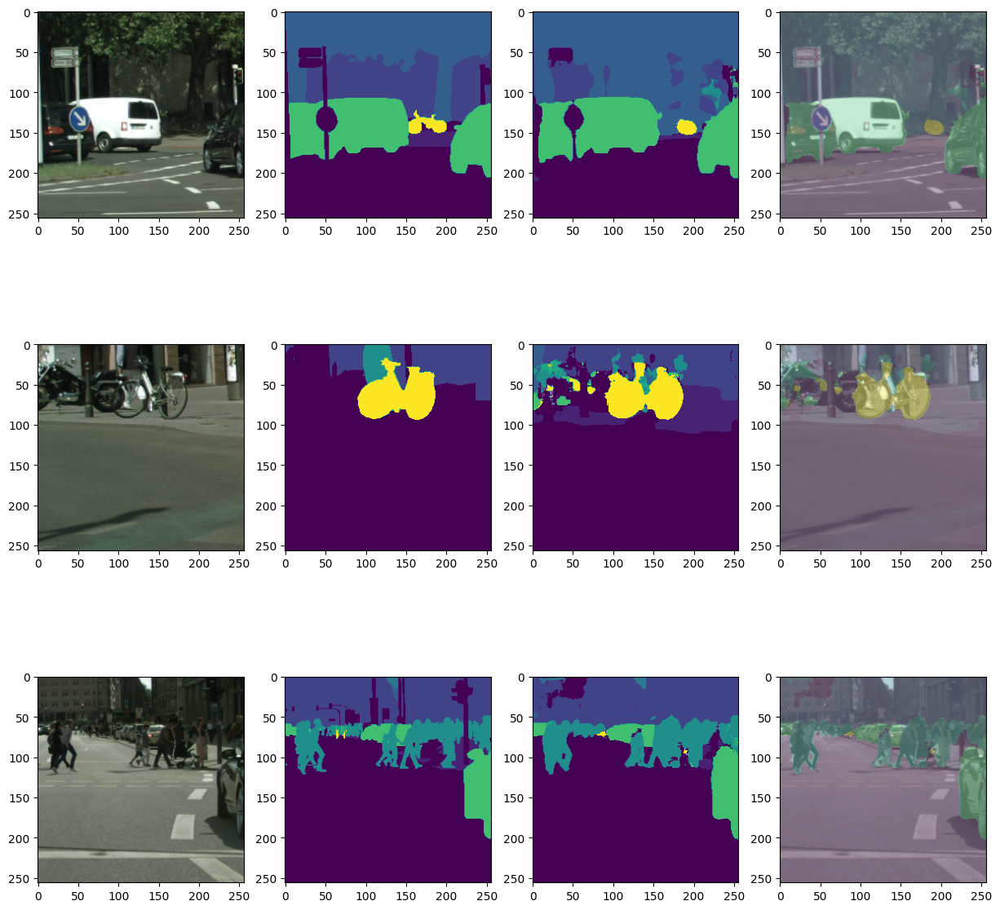

1/1 [==============================] - 0s 60ms/step


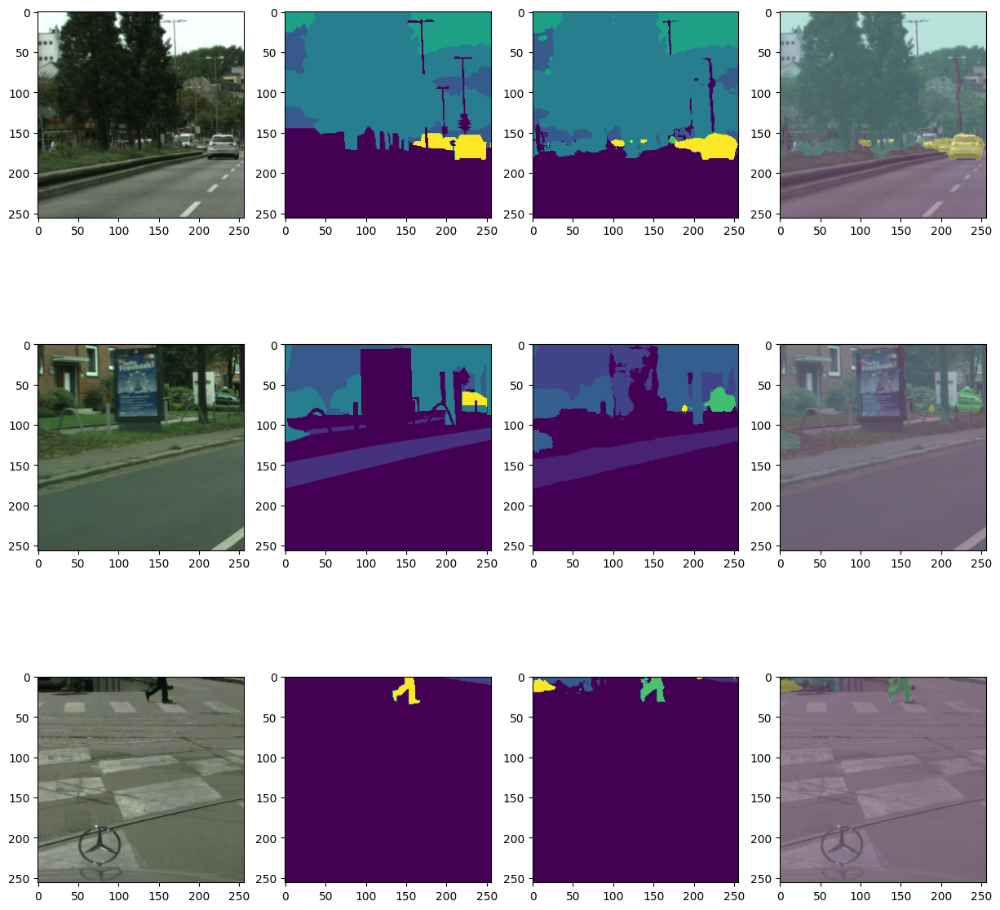

1/1 [==============================] - 0s 31ms/step


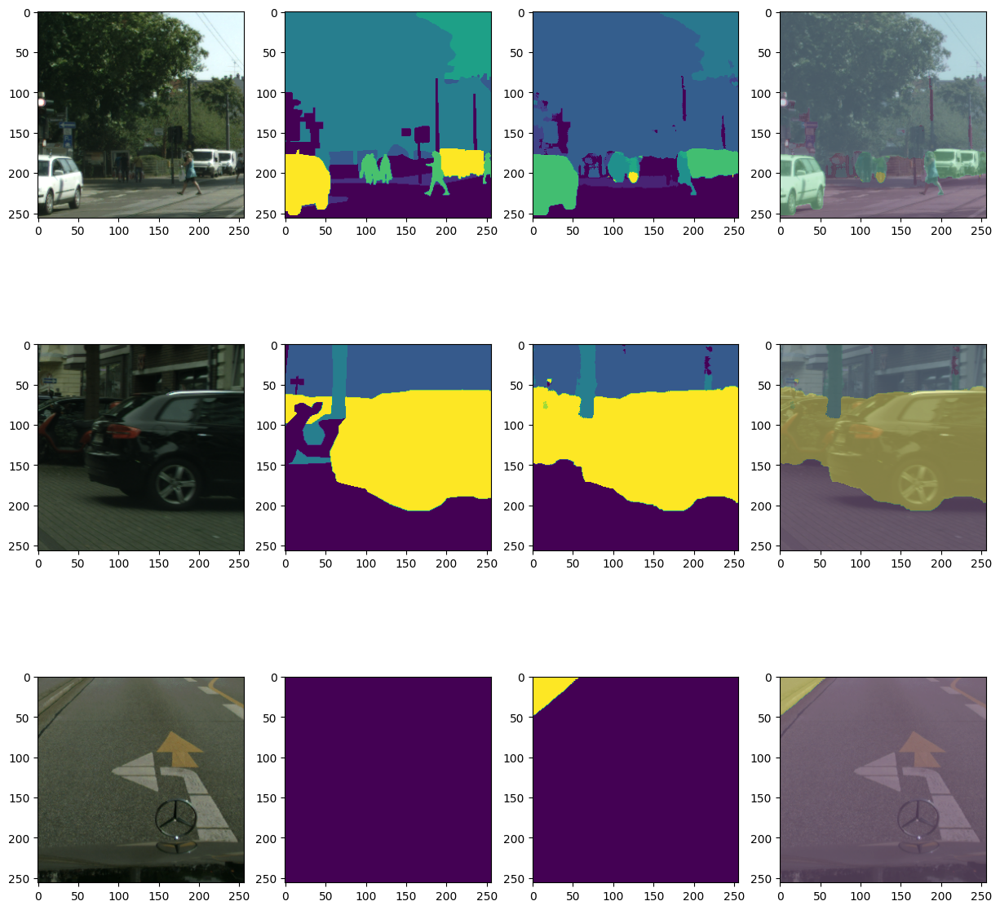

Mean IoU:  0.57426906
Accuracy:  0.8886105
Precision:  0.901267
Recall:  0.9440255


In [17]:
from tensorflow.keras.metrics import MeanIoU
from tensorflow.keras.metrics import MeanIoU, Accuracy, Precision, Recall

miou_metric = MeanIoU(num_classes=11)
accuracy_metric = Accuracy()
precision_metric = Precision()
recall_metric = Recall()

model.save_weights('new_weight.h5')
model.load_weights('new_weight.h5')

num = 3
for image, mask in dataset_val.take(10):
    pred_mask = model.predict(image)
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    
    fig = plt.figure(figsize=(15, num * 5))
    for i in range(num):
        miou_metric.update_state(mask, pred_mask)
        accuracy_metric.update_state(mask, pred_mask)
        precision_metric.update_state(mask, pred_mask)
        recall_metric.update_state(mask, pred_mask)
        
        plt.subplot(num, 4, i * 4 + 1)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(image[i]))
        
        plt.subplot(num, 4, i * 4 + 2)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(mask[i]))
        
        plt.subplot(num, 4, i * 4 + 3)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(pred_mask[i]))
        
        plt.subplot(num, 4, i * 4 + 4)
        overlay_mask = tf.keras.preprocessing.image.array_to_img(pred_mask[i])
        overlay_image = tf.keras.preprocessing.image.array_to_img(image[i])
        plt.imshow(overlay_image, alpha=0.7)
        plt.imshow(overlay_mask, alpha=0.3)
    
    plt.show()

miou = miou_metric.result().numpy()
accuracy = accuracy_metric.result().numpy()
precision = precision_metric.result().numpy()
recall = recall_metric.result().numpy()  
    
print("Mean IoU: ", miou)
print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)

1/1 [==============================] - 0s 93ms/step


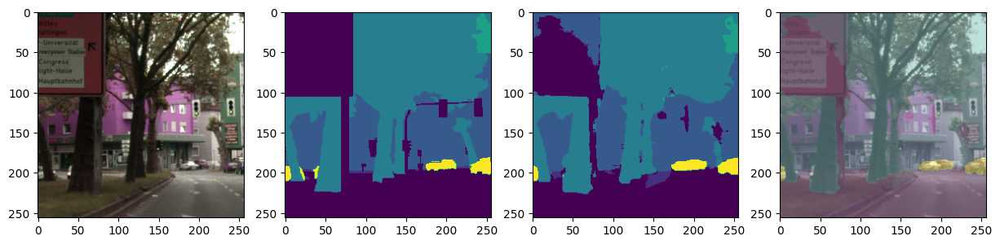

1/1 [==============================] - 0s 113ms/step


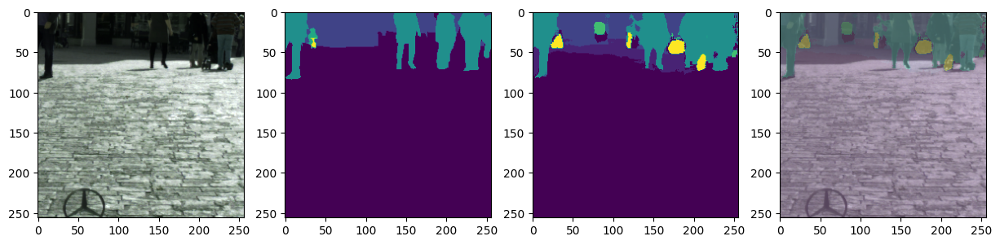

1/1 [==============================] - 0s 79ms/step


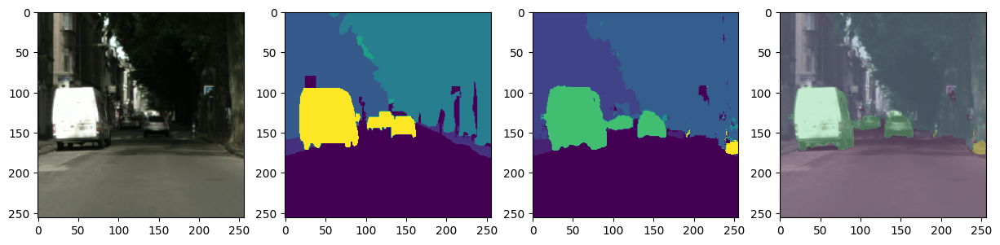

1/1 [==============================] - 0s 106ms/step


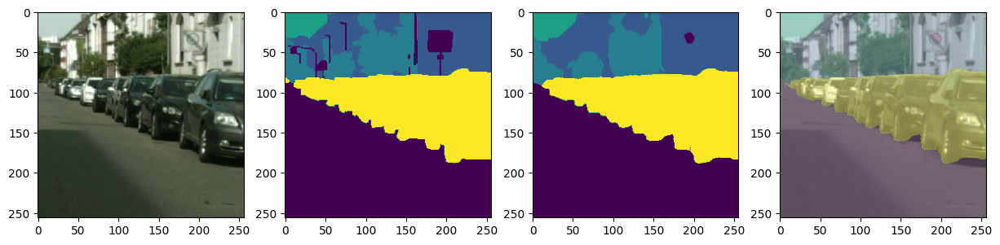

1/1 [==============================] - 0s 72ms/step


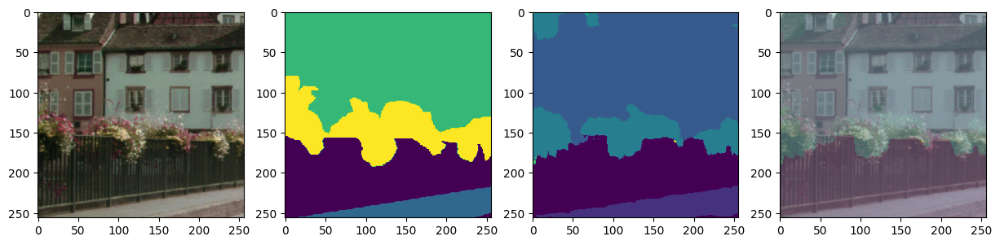

1/1 [==============================] - 0s 94ms/step


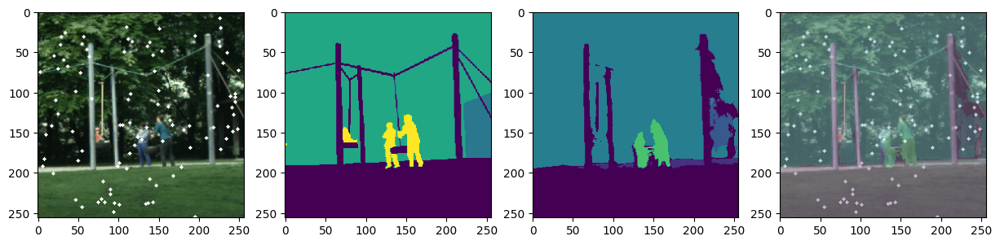

1/1 [==============================] - 0s 112ms/step


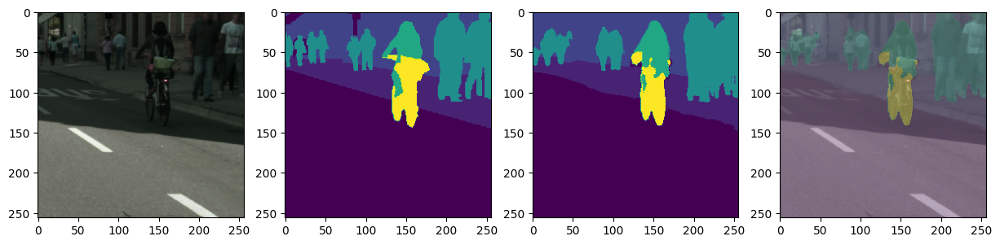

1/1 [==============================] - 0s 118ms/step


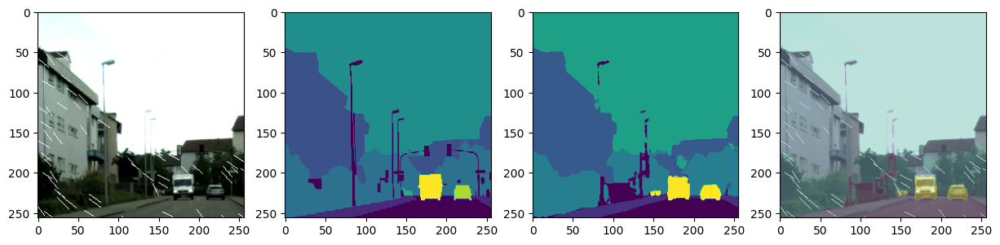

1/1 [==============================] - 0s 105ms/step


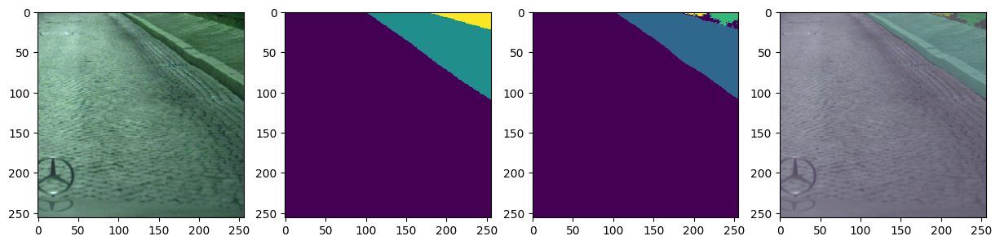

1/1 [==============================] - 0s 27ms/step


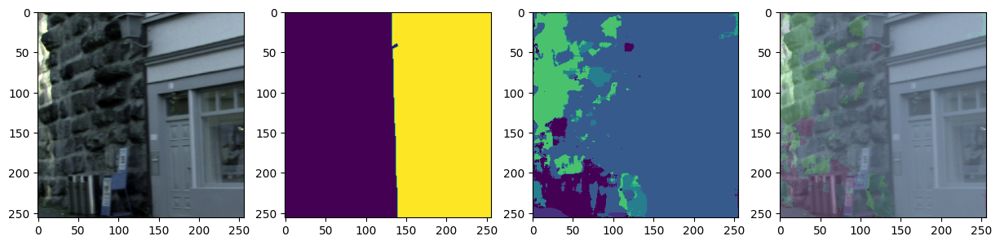

Mean IoU:  0.57426906
Accuracy:  0.8886105
Precision:  0.901267
Recall:  0.9440255


In [18]:
num = 1
for image, mask in dataset_train.take(10):
    pred_mask = model.predict(image)
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    
    fig = plt.figure(figsize=(15, num * 5))
    for i in range(num):
        plt.subplot(num, 4, i * 4 + 1)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(image[i]))
        
        plt.subplot(num, 4, i * 4 + 2)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(mask[i]))
        
        plt.subplot(num, 4, i * 4 + 3)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(pred_mask[i]))
        
        plt.subplot(num, 4, i * 4 + 4)
        overlay_mask = tf.keras.preprocessing.image.array_to_img(pred_mask[i])
        overlay_image = tf.keras.preprocessing.image.array_to_img(image[i])
        plt.imshow(overlay_image, alpha=0.7)
        plt.imshow(overlay_mask, alpha=0.3)
    
    plt.show()

print("Mean IoU: ", miou)
print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)

In [19]:
import pandas as pd
import tensorflow as tf
from tensorflow.keras.metrics import MeanIoU, Accuracy, Precision, Recall

model.load_weights('new_weight.h5')

num_classes = 11
miou_metric = MeanIoU(num_classes=num_classes)
accuracy_metric = Accuracy()
precision_metric = Precision()
recall_metric = Recall()

for image, mask in dataset_val.take(10):
    pred_mask = model.predict(image)
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    
    miou_metric.update_state(mask, pred_mask)
    accuracy_metric.update_state(mask, pred_mask)
    precision_metric.update_state(mask, pred_mask)
    recall_metric.update_state(mask, pred_mask)

metrics_values = {
    'mIoU': miou_metric.result().numpy(),
    'Accuracy': accuracy_metric.result().numpy(),
    'Precision': precision_metric.result().numpy(),
    'Recall': recall_metric.result().numpy(),
}

confusion_matrix = miou_metric.get_weights()[0]
ious = [(confusion_matrix[i, i] / (np.sum(confusion_matrix[:, i]) + np.sum(confusion_matrix[i, :]) - confusion_matrix[i, i] + 1e-7)) for i in range(num_classes)]
miou = np.mean(ious)
metrics_df = pd.DataFrame({'Class ID': list(range(num_classes)) + ['Overall'], 'IoU': ious + [miou]})

print(metrics_values)
print(metrics_df)


1/1 [==============================] - 0s 28ms/step
{'mIoU': 0.57136893, 'Accuracy': 0.88047624, 'Precision': 0.8953423, 'Recall': 0.93631715}
   Class ID       IoU
0         0  0.829676
1         1  0.558698
2         2  0.755010
3         3  0.811964
4         4  0.879643
5         5  0.596765
6         6  0.292263
7         7  0.852437
8         8  0.115550
9         9  0.171208
10       10  0.421845
11  Overall  0.571369


In [20]:
import numpy as np
from sklearn.metrics import confusion_matrix

def pixel_accuracy(confusion_matrix):
    correct_pixels = np.diag(confusion_matrix).sum()
    total_pixels = confusion_matrix.sum()
    return correct_pixels / total_pixels

def class_wise_pixel_accuracy(confusion_matrix):
    class_accuracies = np.diag(confusion_matrix) / confusion_matrix.sum(axis=1)
    return np.nanmean(class_accuracies)

def mean_pixel_accuracy(confusion_matrix):
    return np.diag(confusion_matrix).sum() / confusion_matrix.sum()

def dice_coefficient(confusion_matrix):
    true_positives = np.diag(confusion_matrix)
    false_negatives = np.sum(confusion_matrix, axis=1) - true_positives
    false_positives = np.sum(confusion_matrix, axis=0) - true_positives
    dice = 2 * true_positives / (2 * true_positives + false_positives + false_negatives)
    return np.nanmean(dice)

y_true_list = []
y_pred_list = []

for image, mask in dataset_val:
    pred_mask = model.predict(image)
    pred_mask = np.argmax(pred_mask, axis=-1)
    
    y_true_list.extend(np.asarray(mask).flatten())
    y_pred_list.extend(pred_mask.flatten())

num_classes = 11  
cm = confusion_matrix(y_true_list, y_pred_list, labels=range(num_classes))

pa = pixel_accuracy(cm)
cpa = class_wise_pixel_accuracy(cm)
mpa = mean_pixel_accuracy(cm)
dice = dice_coefficient(cm)

print("Pixel Accuracy (PA):", pa)
print("Class-wise Pixel Accuracy (CPA):", cpa)
print("Mean Pixel Accuracy (MPA):", mpa)
print("Dice Coefficient:", dice)

1/1 [==============================] - 0s 47ms/step
Pixel Accuracy (PA): 0.8912834771245504
Class-wise Pixel Accuracy (CPA): 0.6776048721752632
Mean Pixel Accuracy (MPA): 0.8912834771245504
Dice Coefficient: 0.6732590389460835


In [21]:
import numpy as np
from sklearn.metrics import cohen_kappa_score, jaccard_score

y_true_list = []
y_pred_list = []

for image, mask in dataset_val:
    pred_mask = model.predict(image)
    pred_mask = np.argmax(pred_mask, axis=-1)
    
    mask = mask.numpy().flatten()
    pred_mask = pred_mask.flatten()
    
    y_true_list.extend(mask)
    y_pred_list.extend(pred_mask)

kappa = cohen_kappa_score(y_true_list, y_pred_list)

jaccard = jaccard_score(y_true_list, y_pred_list, average='macro')


print("Kappa Score:", kappa)
print("Jaccard Similarity Score:", jaccard)
# print("Frequency Weighted Intersection over Union:", fw_iou)

1/1 [==============================] - 0s 30ms/step
Kappa Score: 0.8378372636887961
Jaccard Similarity Score: 0.5794076848011596


In [ ]:
import time
import tensorflow as tf

total_frames = 0
start_time = time.time()

for images, _ in dataset_val:
    if total_frames == 0:
        _ = model(images, training=False)
        
    start = time.time()
    _ = model(images, training=False)
    end = time.time()
    
    total_frames += images.shape[0]
    print(f"Processed {images.shape[0]} frames in {end - start:.4f} seconds.")

end_time = time.time()
total_time = end_time - start_time

fps = total_frames / total_time
print(f"Model FPS on validation dataset: {fps:.2f}")


2024-04-30 22:43:42.704504: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 6.77GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


Processed 24 frames in 0.0257 seconds.
Processed 24 frames in 0.1987 seconds.
Processed 24 frames in 0.2125 seconds.
Processed 24 frames in 0.1703 seconds.
Processed 24 frames in 0.0548 seconds.
Processed 24 frames in 0.0300 seconds.
Processed 24 frames in 0.0571 seconds.
Processed 24 frames in 0.0515 seconds.
Processed 24 frames in 0.0519 seconds.
Processed 24 frames in 0.0516 seconds.
Processed 24 frames in 0.0558 seconds.
Processed 24 frames in 0.0450 seconds.
Processed 24 frames in 0.0522 seconds.
Processed 24 frames in 0.0472 seconds.
Processed 24 frames in 0.0597 seconds.
Processed 24 frames in 0.0402 seconds.
Processed 24 frames in 0.0530 seconds.
Processed 24 frames in 0.0409 seconds.
Processed 24 frames in 0.0419 seconds.
Processed 24 frames in 0.0510 seconds.
Processed 24 frames in 0.0521 seconds.
Processed 24 frames in 0.0438 seconds.
Processed 24 frames in 0.0388 seconds.
Processed 24 frames in 0.0492 seconds.
Processed 24 frames in 0.0394 seconds.
Processed 24 frames in 0.